In [1]:
# %load_ext autoreload
# %autoreload 2

In [13]:
import torchaudio
import yapecs
import librosa
from matplotlib import pyplot as plt
from IPython.display import display, Audio

combnet = yapecs.compose('combnet', ['/home/cameron/combnet/config/giantsteps-conv.py'])

torch.Size([1, 5292000])
torch.Size([105, 4097])


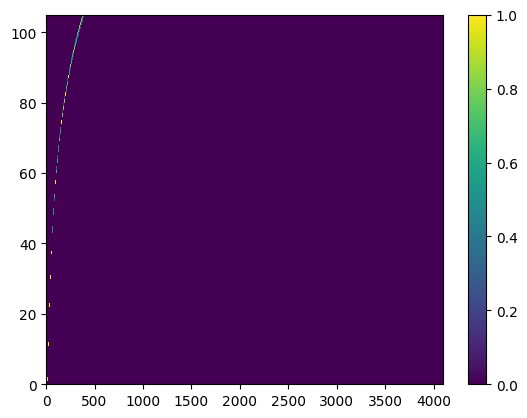

torch.Size([1, 105, 600])


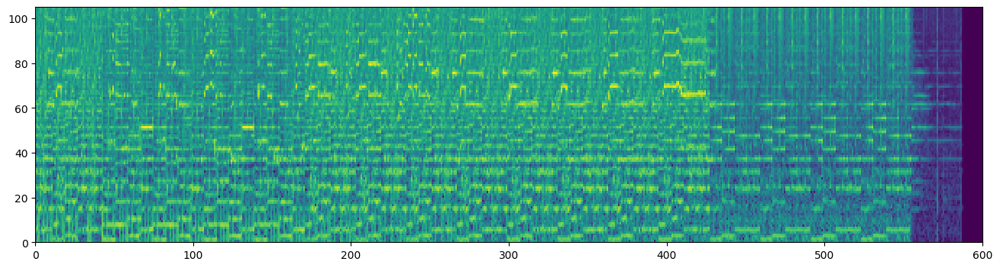

In [14]:
# model = combnet.models.classifiers.ConvClassifier()
model = combnet.models.classifiers.ConvClassifier(features='madmom')

# audio, sr = torchaudio.load(combnet.DATA_DIR / 'giantsteps' / '10089.LOFI.wav')
audio, sr = torchaudio.load(combnet.DATA_DIR / 'giantsteps' / '10089.LOFI.wav')

audio = audio.mean(0, keepdims=True)

display(Audio(audio, rate=sr))

print(audio.shape)

filters = model.filters

# filters = filters[..., :400]
# filters = filters[..., :20]
# filters = filters[:20, :25]
# filters = filters[..., :100]

print(filters.shape)
plt.pcolormesh(filters); plt.colorbar(); plt.show()

out = model._extract_features(audio).detach()

print(out.shape)

plt.gcf().set_size_inches(16, 4)

plt.pcolormesh(out.squeeze()); plt.show()

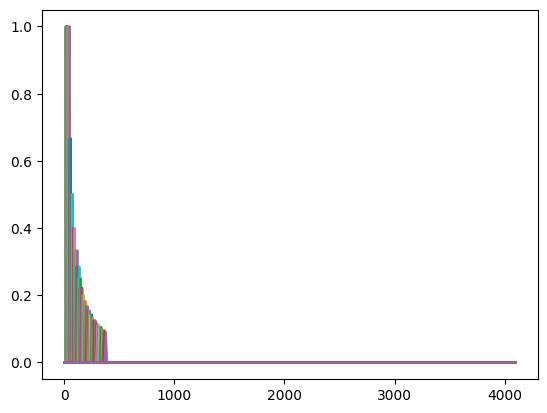

In [12]:
for f in filters:
    f = f.cpu().numpy()
    plt.plot(range(0, len(f)), f)
plt.show()

In [15]:
total = 0
for p in model.parameters():
    total += p.numel()
total

11497